In [1]:
import pandas as pd
import scanpy as sc
import numpy as np
import torch
import sys
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
import pandas as pd
import scanpy as sc
import numpy as np
import torch
import sys
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f'On device: {device}')
dtype = torch.float64

sys.path.insert(0, '/home/ph3641/DeST_OT_LR/')
import clustering
import util_LR
import DeSTOT_LRDist

daniocell_dir = '/scratch/gpfs/ph3641/zebrafish/daniocell.h5ad'
adata_daniocell = sc.read_h5ad(daniocell_dir)

stages = np.unique(adata_daniocell.obs['hpf'].values)


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f'On device: {device}')
dtype = torch.float64

filehandle_zf = '/scratch/gpfs/ph3641/zebrafish/'

zf_list = ['zf3', 'zf5', 'zf10', 'zf12', 'zf18', 'zf24']
zf_names = zf_list
filehandles_zf = [filehandle_zf + 'pair' + str(k) + '/' for k in range(len(zf_list))]
N = len(filehandles_zf)

spatial_list = []
exclude_rows = [1099, None, None, 325, None, None]

for i in range(len(zf_list)):
    file_spatial = filehandles_zf[i] + zf_names[i] +'_spatial.npy'
    if i == len(zf_list) - 1:
        file_spatial = filehandles_zf[i-1] + zf_names[i] +'_spatial.npy'
    spatial = np.load(file_spatial)
    nidx = exclude_rows[i]
    if nidx is not None:
        spatial = np.concatenate((spatial[:nidx,:], spatial[nidx+1:,:]))
    spatial_list.append(spatial)


def load_mats(save_dir, s1_name, s2_name, device, z=None, c=100, nidx_1=None, nidx_2=None):
    # Load costs
    A = np.load(save_dir + 'SA.npy')
    B = np.load(save_dir + 'SB.npy')
    
    ys = torch.from_numpy(np.load(save_dir + s1_name + f'_feature.npy')).type(torch.DoubleTensor).to(device)
    ys2 = torch.from_numpy(np.load(save_dir + s2_name + f'_feature.npy')).type(torch.DoubleTensor).to(device)
    
    if nidx_1 is not None:
        ys = torch.cat((ys[:nidx_1,:], ys[nidx_1+1:,:]))
    if nidx_2 is not None:
        ys2 = torch.cat((ys2[:nidx_2,:], ys2[nidx_2+1:,:]))
    
    C = torch.cdist(ys, ys2).type(torch.DoubleTensor).to(device)
    
    norm1 = c
    norm2 = A.max()*c
    norm3 = B.max()*c
    
    if z is None:
        # No low-rank factorization applied to the distance matrix
        A = torch.from_numpy(A).to(device)
        B = torch.from_numpy(B).to(device)
        C_factors = (C/ (norm1), torch.eye(C.shape[1]).type(torch.DoubleTensor).to(device))
        A_factors = (A/ (norm2), torch.eye(A.shape[1]).type(torch.DoubleTensor).to(device))
        B_factors = (B/ (norm3), torch.eye(B.shape[1]).type(torch.DoubleTensor).to(device))

    else:
        # Distance matrix factored using SVD
        u, s, v = torch.svd(C)
        print('C done')
        V_C,U_C = torch.mm(u[:,:z], torch.diag(s[:z])), v[:,:z].mT
        u, s, v = torch.svd(torch.from_numpy(A).to(device))
        print('A done')
        V1_A,V1_B = torch.mm(u[:,:z], torch.diag(s[:z])), v[:,:z].mT
        u, s, v = torch.svd(torch.from_numpy(B).to(device))
        print('B done')
        V2_A,V2_B = torch.mm(u[:,:z], torch.diag(s[:z])), v[:,:z].mT
        C_factors, A_factors, B_factors = ((V_C.type(torch.DoubleTensor).to(device)/norm1, U_C.type(torch.DoubleTensor).to(device)/norm1), \
                                       (V1_A.type(torch.DoubleTensor).to(device)/norm2, V1_B.type(torch.DoubleTensor).to(device)/norm2), \
                                       (V2_A.type(torch.DoubleTensor).to(device)/norm3, V2_B.type(torch.DoubleTensor).to(device)/norm3))
    
    return C_factors, A_factors, B_factors


'''
def load_all_mats(filehandles, slice_names, mask_indices, device, z=None, c=100):

    As = []
    Bs = []
    Cs = []
    
    c = -np.inf
    N = len(filehandles)

    for i in range(N-2, -1, -1):
        
        s1_name, s2_name = zf_names[i], zf_names[i+1]
        n_idx1, n_idx2 = mask_indices[i], mask_indices[i+1]
        
        save_dir = filehandle_zf + 'pair' + str(i) + '/'
        
        # Load costs
        A = np.load(save_dir + 'SA.npy')
        B = np.load(save_dir + 'SB.npy')
        
        ys = torch.from_numpy(np.load(save_dir + s1_name + f'_feature.npy')).type(torch.DoubleTensor).to(device)
        ys2 = torch.from_numpy(np.load(save_dir + s2_name + f'_feature.npy')).type(torch.DoubleTensor).to(device)
    
        if nidx_1 is not None:
            ys = torch.cat((ys[:nidx_1,:], ys[nidx_1+1:,:]))
        if nidx_2 is not None:
            ys2 = torch.cat((ys2[:nidx_2,:], ys2[nidx_2+1:,:]))
        
        C = torch.cdist(ys, ys2).type(torch.DoubleTensor).to(device)
    
    norm1 = C.max()*c
    norm2 = A.max()*c
    norm3 = B.max()*c
    
    if z is None:
        # No low-rank factorization applied to the distance matrix
        A = torch.from_numpy(A).to(device)
        B = torch.from_numpy(B).to(device)
        C_factors = (C/ (norm1), torch.eye(C.shape[1]).type(torch.DoubleTensor).to(device))
        A_factors = (A/ (norm2), torch.eye(A.shape[1]).type(torch.DoubleTensor).to(device))
        B_factors = (B/ (norm3), torch.eye(B.shape[1]).type(torch.DoubleTensor).to(device))

    else:
        # Distance matrix factored using SVD
        u, s, v = torch.svd(C)
        print('C done')
        V_C,U_C = torch.mm(u[:,:z], torch.diag(s[:z])), v[:,:z].mT
        u, s, v = torch.svd(torch.from_numpy(A).to(device))
        print('A done')
        V1_A,V1_B = torch.mm(u[:,:z], torch.diag(s[:z])), v[:,:z].mT
        u, s, v = torch.svd(torch.from_numpy(B).to(device))
        print('B done')
        V2_A,V2_B = torch.mm(u[:,:z], torch.diag(s[:z])), v[:,:z].mT
        C_factors, A_factors, B_factors = ((V_C.type(torch.DoubleTensor).to(device)/norm1, U_C.type(torch.DoubleTensor).to(device)/norm1), \
                                       (V1_A.type(torch.DoubleTensor).to(device)/norm2, V1_B.type(torch.DoubleTensor).to(device)/norm2), \
                                       (V2_A.type(torch.DoubleTensor).to(device)/norm3, V2_B.type(torch.DoubleTensor).to(device)/norm3))
    
    return C_factors, A_factors, B_factors
'''

On device: cuda
On device: cuda


"\ndef load_all_mats(filehandles, slice_names, mask_indices, device, z=None, c=100):\n\n    As = []\n    Bs = []\n    Cs = []\n    \n    c = -np.inf\n    N = len(filehandles)\n\n    for i in range(N-2, -1, -1):\n        \n        s1_name, s2_name = zf_names[i], zf_names[i+1]\n        n_idx1, n_idx2 = mask_indices[i], mask_indices[i+1]\n        \n        save_dir = filehandle_zf + 'pair' + str(i) + '/'\n        \n        # Load costs\n        A = np.load(save_dir + 'SA.npy')\n        B = np.load(save_dir + 'SB.npy')\n        \n        ys = torch.from_numpy(np.load(save_dir + s1_name + f'_feature.npy')).type(torch.DoubleTensor).to(device)\n        ys2 = torch.from_numpy(np.load(save_dir + s2_name + f'_feature.npy')).type(torch.DoubleTensor).to(device)\n    \n        if nidx_1 is not None:\n            ys = torch.cat((ys[:nidx_1,:], ys[nidx_1+1:,:]))\n        if nidx_2 is not None:\n            ys2 = torch.cat((ys2[:nidx_2,:], ys2[nidx_2+1:,:]))\n        \n        C = torch.cdist(ys, ys2)

In [2]:

N = len(filehandles_zf)
Qs = [None]*(N-1)
Rs = [None]*(N-1)

key = 'bin_annotation'

labels = []

for i in range(N-2, -1, -1):

    s1_name = zf_names[i]
    s2_name = zf_names[i+1]
    
    print(f'Slice pair {i}, aligning {s1_name} to {s2_name}')
    
    adata_pair = sc.read_h5ad(filehandle_zf + f'pair{i}/' + s1_name + '_' + s2_name + '.h5ad')
    
    adata1 = adata_pair[adata_pair.obs['timepoint'] == 1]
    sc.pp.normalize_total(adata1)
    sc.pp.log1p(adata1)
    
    adata2 = adata_pair[adata_pair.obs['timepoint'] == 2]
    sc.pp.normalize_total(adata2)
    sc.pp.log1p(adata2)
    
    encoder1 = OneHotEncoder(sparse_output=False)
    ys_onehot1 = encoder1.fit_transform(adata1.obs[key].values.reshape(-1, 1))
    _Q = ys_onehot1 / np.sum(ys_onehot1)
    
    encoder2 = OneHotEncoder(sparse_output=False)
    ys_onehot2 = encoder2.fit_transform(adata2.obs[key].values.reshape(-1, 1))
    _R = ys_onehot2 / np.sum(ys_onehot2)

    labels.append(list(encoder2.categories_[0]))
    
    if i == 0:
        labels.append(list(encoder1.categories_[0]))
    
    _Q, _R = torch.from_numpy(_Q).to(device).float(), torch.from_numpy(_R).to(device).float()

    # Filter rows
    nidx_1, nidx_2 = exclude_rows[i], exclude_rows[i+1]
    if nidx_1 is not None:
        _Q = torch.cat((_Q[:nidx_1,:], _Q[nidx_1+1:,:]))
    if nidx_2 is not None:
        _R = torch.cat((_R[:nidx_2,:], _R[nidx_2+1:,:]))
        
    Qs[i], Rs[i] = _Q, _R

Slice pair 4, aligning zf18 to zf24


/home/ph3641/.conda/envs/peterenv2/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:206: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/ph3641/.conda/envs/peterenv2/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:206: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Slice pair 3, aligning zf12 to zf18


/home/ph3641/.conda/envs/peterenv2/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:206: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/ph3641/.conda/envs/peterenv2/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:206: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Slice pair 2, aligning zf10 to zf12


/home/ph3641/.conda/envs/peterenv2/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:206: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/ph3641/.conda/envs/peterenv2/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:206: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Slice pair 1, aligning zf5 to zf10
Slice pair 0, aligning zf3 to zf5


/home/ph3641/.conda/envs/peterenv2/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:206: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/ph3641/.conda/envs/peterenv2/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:206: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/ph3641/.conda/envs/peterenv2/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:206: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/ph3641/.conda/envs/peterenv2/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:206: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [16]:
ranks = [(3,7),(7,7),(7,11),(11,14),(14,19)]
exclude_rows = [1099, None, None, 325, None, None]

i = 3

s1_name = zf_names[i]
s2_name = zf_names[i+1]
s3_name = zf_names[i+2]
print(f'Aligning slices {s1_name} to {s2_name} to {s3_name}')

r1, r2 = ranks[i]
r2, r3 = ranks[i+1]
nidx_1, nidx_2, nidx_3 = exclude_rows[i], exclude_rows[i+1], exclude_rows[i+2]

filehandle_pair = filehandle_zf + 'pair' + str(i) + '/'
save_dir = filehandle_pair
C_factors12, A_factors11, A_factors22 = load_mats(save_dir, s1_name, s2_name, \
                                                device, z=400, c=100, nidx_1=nidx_1, nidx_2=nidx_2)

filehandle_pair = filehandle_zf + 'pair' + str(i+1) + '/'
save_dir = filehandle_pair
C_factors23, A_factors22, A_factors33 = load_mats(save_dir, s2_name, s3_name, \
                                                device, z=400, c=100, nidx_1=nidx_2, nidx_2=nidx_3)

c = max(torch.max(C_factors12[0] @ C_factors12[1]), torch.max( C_factors23[0] @ C_factors23[1]))
c = max(c, 1/c)

C_factors12 = (C_factors12[0]/c, C_factors12[1]/c)
C_factors23 = (C_factors23[0]/c, C_factors23[1]/c)

Aligning slices zf12 to zf18 to zf24
C done
A done
B done
C done
A done
B done


In [45]:
'''gamma=30
tau_out=1
tau_in=1e-5'''
gamma=30
tau_out=1
tau_in=1e-6 #5
alpha = 0.1 #0.8 #0.98
beta = 0.0

In [46]:
'''
# First pair
init_args = (None, None, None)
Q1,R1,T1, errs = DeSTOT_LRDist.DeSTOT_LR_opt(C_factors12, \
                                              A_factors11, \
                                             A_factors22, \
                                          a=None, b=None, \
                                          r=r1, r2=r2, max_iter= 50, device=device, \
                                         returnFull=False, alpha=alpha, beta=beta, \
                                        min_iter = 50, initialization='Full', tau_out=tau_out, tau_in=tau_in, gamma=gamma, \
                                        dtype=torch.float64, updateR = True, updateQ = True, updateT = True, init_args=init_args)

gQ = Q1.T @ torch.ones(Q1.shape[0]).type(torch.DoubleTensor).to(device)
gR = R1.T @ torch.ones(R1.shape[0]).type(torch.DoubleTensor).to(device)

print(gQ)
print(gR)

# Second pair
init_args = (None, None, None)
Q2,R2,T2, errs = DeSTOT_LRDist.DeSTOT_LR_opt(C_factors23, \
                                              A_factors22, \
                                             A_factors33, \
                                          a=None, b=None, \
                                          r=r2, r2=r3, max_iter=50, device=device, \
                                         returnFull=False, alpha=alpha, beta=beta, \
                                        min_iter = 50, initialization='Full', tau_out=tau_out, tau_in=tau_in, gamma=gamma, \
                                        dtype=torch.float64, updateR = True, updateQ = True, updateT = True, init_args=init_args)

gQ = Q2.T @ torch.ones(Q2.shape[0]).type(torch.DoubleTensor).to(device)
gR = R2.T @ torch.ones(R2.shape[0]).type(torch.DoubleTensor).to(device)
'''

# Initialize as arguments
init_args = (Qs[i].type(torch.DoubleTensor).to(device), Rs[i+1].type(torch.DoubleTensor).to(device))
Q1, R2 = init_args

# Learn smoothed co-clustering Q_t
Q_t, T_tm1t, T_ttp1 = DeSTOT_LRDist.DeSTOT_LR_opt_multimarginal(C_factors12, \
                                              A_factors11, \
                                             A_factors22, \
                                                C_factors23, \
                                              A_factors22, \
                                             A_factors33,  \
                                            r=r2, max_iter=120, device=device, \
                                             returnFull=False, alpha=alpha, beta=beta, \
                                            min_iter = 100, initialization='Full', tau_out=tau_out, tau_in=tau_in, gamma=gamma, \
                                            dtype=torch.float64, init_args=init_args)
gQ = Q_t.T @ torch.ones(Q_t.shape[0]).type(torch.DoubleTensor).to(device)
print(gQ)

Ranks: r1 11, r2 14, r3 19
Iteration: 0
tensor(0.0001, device='cuda:0', dtype=torch.float64)
tensor(3.6049e-08, device='cuda:0', dtype=torch.float64)
tensor(0.0001, device='cuda:0', dtype=torch.float64)
tensor(1.0612e-06, device='cuda:0', dtype=torch.float64)
tensor(0.0001, device='cuda:0', dtype=torch.float64)
tensor(1.8670e-06, device='cuda:0', dtype=torch.float64)
tensor(0.0001, device='cuda:0', dtype=torch.float64)
tensor(2.4491e-06, device='cuda:0', dtype=torch.float64)
tensor(0.0001, device='cuda:0', dtype=torch.float64)
tensor(2.9875e-06, device='cuda:0', dtype=torch.float64)
tensor(0.0001, device='cuda:0', dtype=torch.float64)
tensor(3.3928e-06, device='cuda:0', dtype=torch.float64)
tensor(0.0001, device='cuda:0', dtype=torch.float64)
tensor(3.6920e-06, device='cuda:0', dtype=torch.float64)
tensor(0.0001, device='cuda:0', dtype=torch.float64)
tensor(3.9576e-06, device='cuda:0', dtype=torch.float64)
tensor(0.0001, device='cuda:0', dtype=torch.float64)
tensor(4.1887e-06, device='

torch.Size([3048, 2])
torch.Size([5271, 2])
3048
5271
Number of clusters in slice 1: 14
Number of clusters in slice 2: 19
Number of clusters in common: 14
Number of clusters total: 19


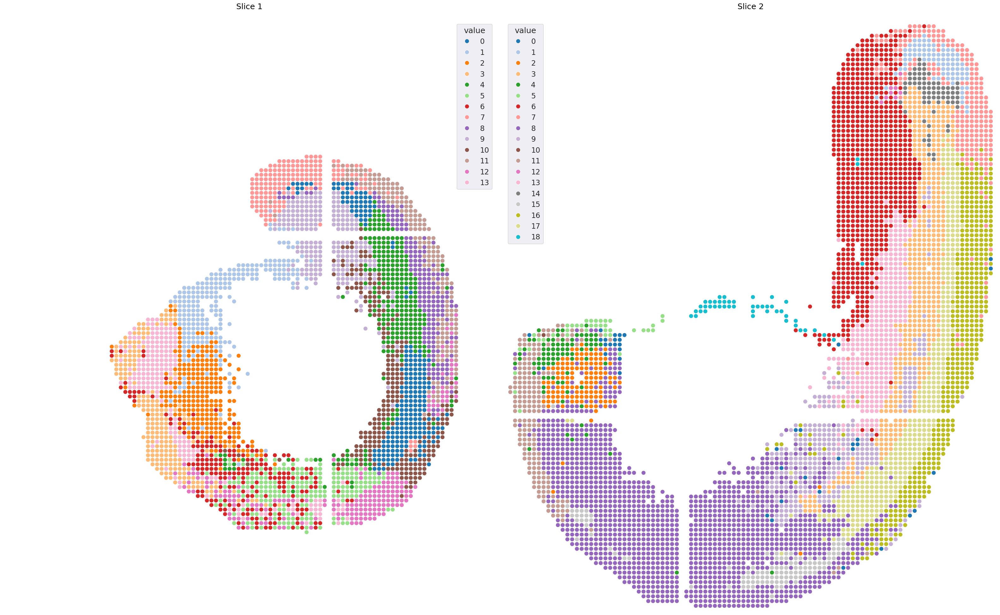

In [47]:
spatial_list2 = []
for i in range(len(zf_list)):
    file_spatial = filehandles_zf[i] + zf_names[i] +'_spatial.npy'
    if i == len(zf_list) - 1:
        file_spatial = filehandles_zf[i-1] + zf_names[i] +'_spatial.npy'
    spatial = np.load(file_spatial)
    spatial_list2.append(spatial)

i = 3
xs = torch.from_numpy(spatial_list[i+1]).to(device)
xs2 = torch.from_numpy(spatial_list2[i+2]).to(device)

ml_labels_W, ml_labels_H = clustering.max_likelihood_clustering(Q_t.cpu().numpy(), R2.cpu().numpy())
print(xs.shape)
print(xs2.shape)
print(len(ml_labels_W))
print(len(ml_labels_H))

clustering.plot_cluster_pair(xs,
                            xs2,
                                 ml_labels_W,
                                 ml_labels_H, dotsize=100)

np.save('wasserstein_joint_ML.npy', np.array(ml_labels_W))

Progress: 0/5271
Number of clusters in slice 1: 10
Number of clusters in slice 2: 10
Number of clusters in common: 10
Number of clusters total: 10


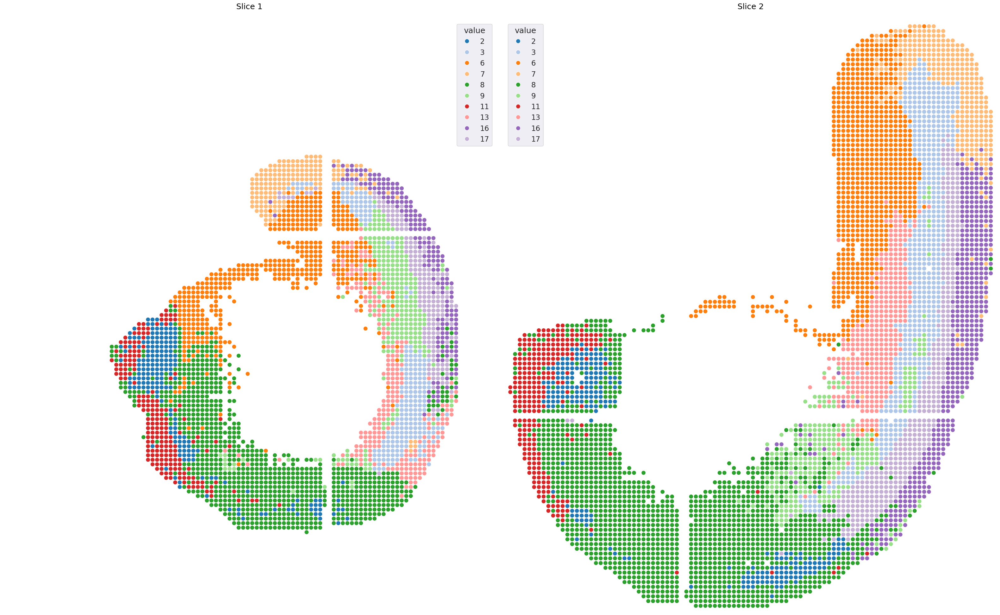

In [48]:
ml_labels_W, ml_labels_H = clustering.ancestral_clustering(Q_t.cpu().numpy(),R2.cpu().numpy(),T_ttp1.cpu().numpy(), full_P=False)
clustering.plot_cluster_pair(xs,
                            xs2,
                                 ml_labels_W,
                                 ml_labels_H, dotsize=100)

np.save('wasserstein_joint.npy', np.array(ml_labels_W))

Progress: 0/3048
Number of clusters in slice 1: 10
Number of clusters in slice 2: 10
Number of clusters in common: 10
Number of clusters total: 10


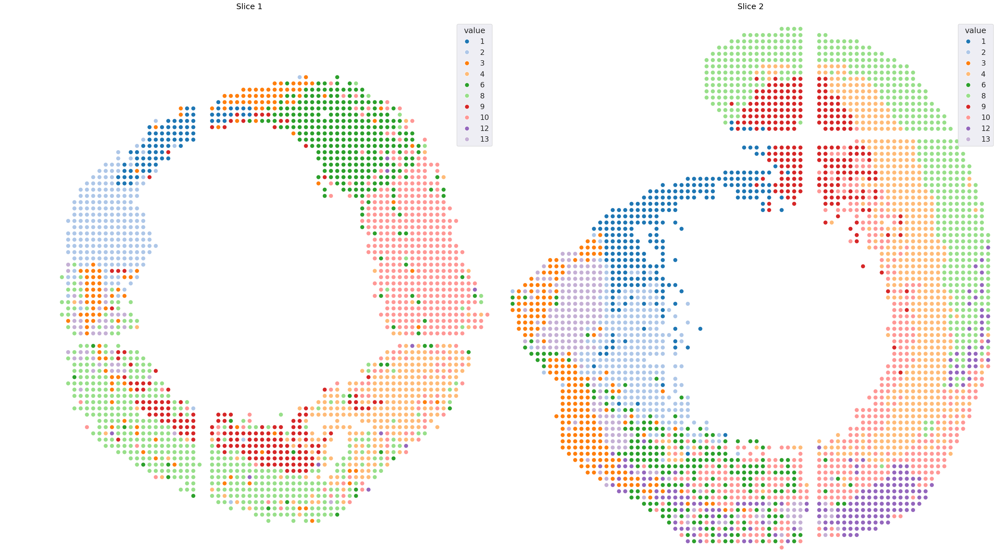

In [49]:
xs0 = torch.from_numpy(spatial_list[i]).to(device)
ml_labels_W, ml_labels_H = clustering.ancestral_clustering(Q1.cpu().numpy(),Q_t.cpu().numpy(),T_tm1t.cpu().numpy(), full_P=False)
clustering.plot_cluster_pair(xs0,
                            xs,
                                 ml_labels_W,
                                 ml_labels_H, dotsize=100)

Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Iteration: 100
Iteration: 125
Iteration: 150
Iteration: 175
Initial Wasserstein cost: 3.324645277200377e-09, Triplet cost: 6.86321431489428e-08, (partial) GW-cost: -1.7180807525715143e-08, Total cost: 1.2740999969088252e-09
Final Wasserstein cost: 3.0030685028279857e-09, Triplet cost: 5.104103014017383e-08, (partial) GW-cost: -1.9281979135622148e-08, Total cost: 7.745637389829723e-10


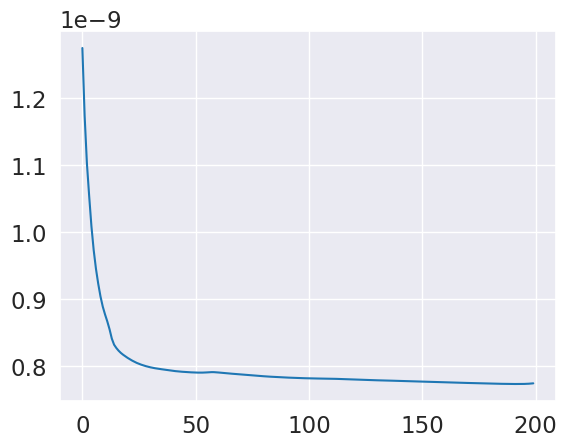

tensor([0.0615, 0.0712, 0.0806, 0.0748, 0.0638, 0.0675, 0.0726, 0.0791, 0.0762,
        0.0623, 0.0723, 0.0809, 0.0672, 0.0689], device='cuda:0',
       dtype=torch.float64)


In [51]:
init_args = (None, R2, None)

Qb,Rb,Tb, errs = DeSTOT_LRDist.DeSTOT_LR_opt(C_factors23, \
                                              A_factors22, \
                                             A_factors33, \
                                          a=None, b=None, \
                                          r=r2, r2=r3, max_iter= 220, device=device, \
                                         returnFull=False, alpha=alpha, beta=beta, \
                                        min_iter = 200, initialization='Full', tau_out=tau_out, tau_in=tau_in, gamma=gamma, \
                                        dtype=torch.float64, updateR = False, updateQ = True, updateT = True, init_args=init_args)
gQ = Qb.T @ torch.ones(Qb.shape[0]).type(torch.DoubleTensor).to(device)
print(gQ)

Progress: 0/5271
Number of clusters in slice 1: 10
Number of clusters in slice 2: 10
Number of clusters in common: 10
Number of clusters total: 10


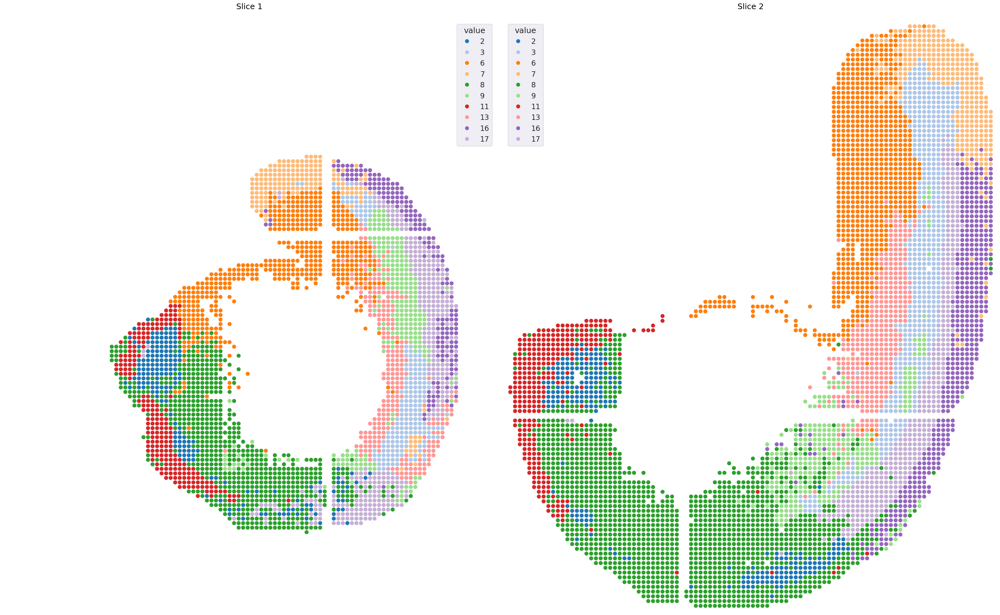

In [52]:
ml_labels_W, ml_labels_H = clustering.ancestral_clustering(Qb.cpu().numpy(),Rb.cpu().numpy(),Tb.cpu().numpy(), full_P=False)
clustering.plot_cluster_pair(xs,
                            xs2,
                                 ml_labels_W,
                                 ml_labels_H, dotsize=100)
np.save('wasserstein_backward.npy', np.array(ml_labels_W))